# Praktikum Visi Komputer
## Modul ke-11

## Stereo Vision and 3D Reconstruction
(Penglihatan stereo dan rekontruksi 3D)

### Korespondensi stereo

Saat kita mengambil gambar, kita memproyeksikan dunia 3D di sekitar kita pada bidang gambar 2D. Jadi secara teknis, kita hanya memiliki informasi 2D ketika kita mengambil foto-foto itu. Karena semua objek dalam pemandangan itu diproyeksikan ke bidang 2D datar, informasi kedalaman (depth) hilang. Kita tidak memiliki cara untuk mengetahui seberapa jauh suatu objek dari kamera atau bagaimana objek diposisikan terhadap satu sama lain dalam ruang 3D. Di sinilah stereo vision muncul.

Manusia sangat pandai dalam menyimpulkan informasi mendalam dari dunia nyata. Alasannya adalah karena kita memiliki dua mata yang diposisikan beberapa inci dari satu sama lain. Setiap mata bertindak sebagai sebuah kamera dan kita menangkap dua gambar dari pemandangan yang sama dari dua sudut pandang yang berbeda, yaitu, satu gambar masing-masing menggunakan mata kiri dan kanan. Jadi, otak kita mengambil dua gambar ini dan membuat peta 3D menggunakan penglihatan stereo. Inilah yang ingin kita capai dengan menggunakan algoritma stereo vision. Kita dapat mengambil dua foto dari pemandangan yang sama menggunakan sudut pandang yang berbeda, lalu mencocokkan titik yang sesuai untuk mendapatkan peta kedalaman pemandangan.

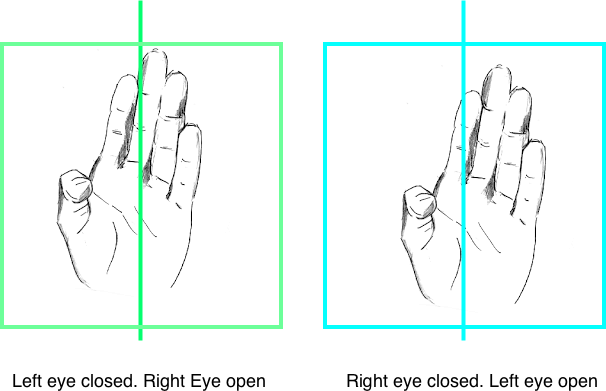

Mari kita perhatikan gambar berikut:

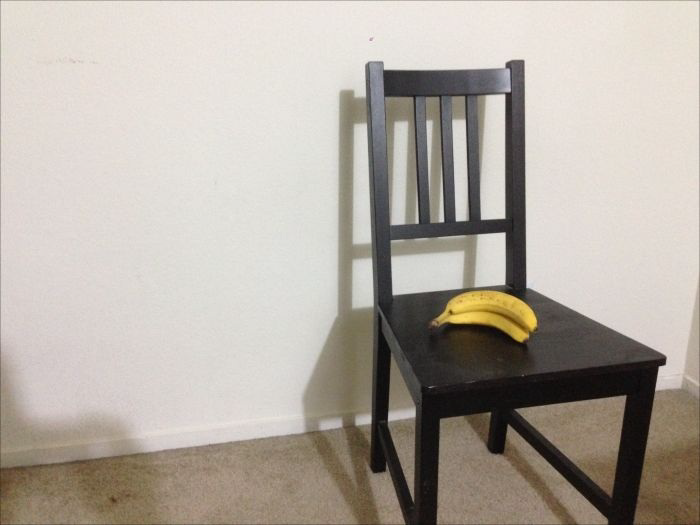

Sekarang, jika kita menangkap pemandangan yang sama dari sudut yang berbeda, akan terlihat seperti ini:

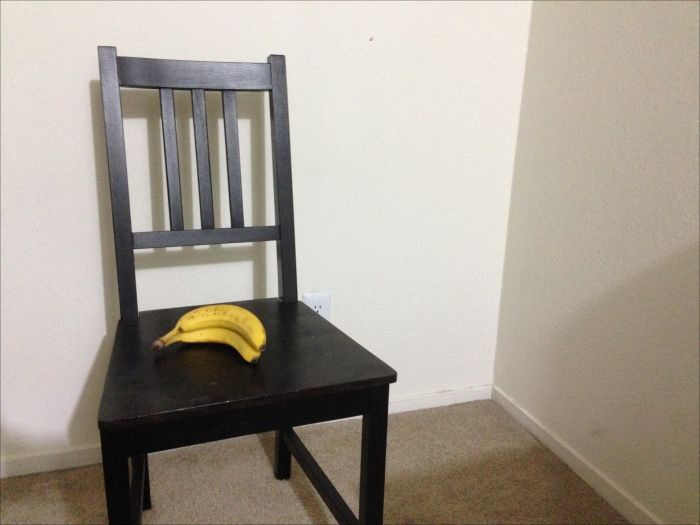

Seperti yang kita lihat, ada sejumlah besar gerakan di posisi objek dalam gambar. Jika Anda mempertimbangkan koordinat piksel, nilai posisi awal dan posisi akhir akan sangat berbeda dalam dua gambar ini. Perhatikan gambar berikut:

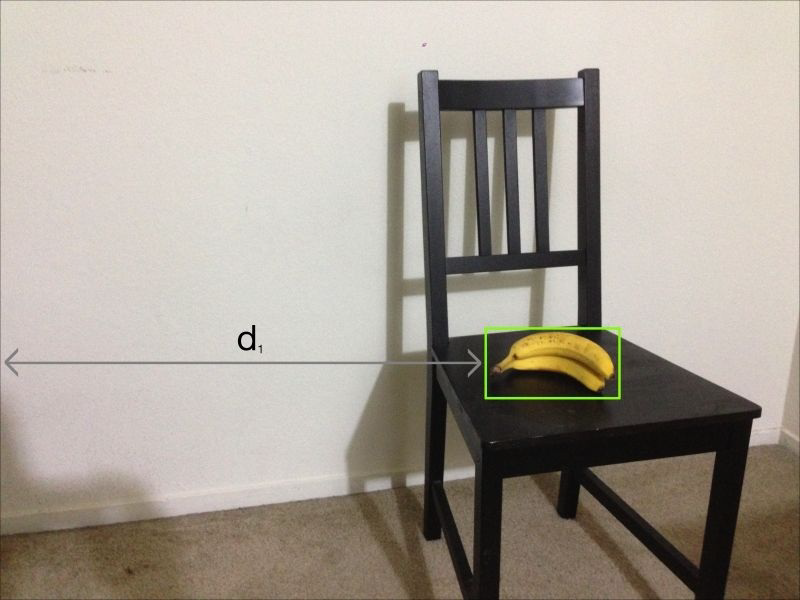

Jika kita perhatikan garis jarak yang sama pada gambar kedua, maka akan terlihat seperti ini:

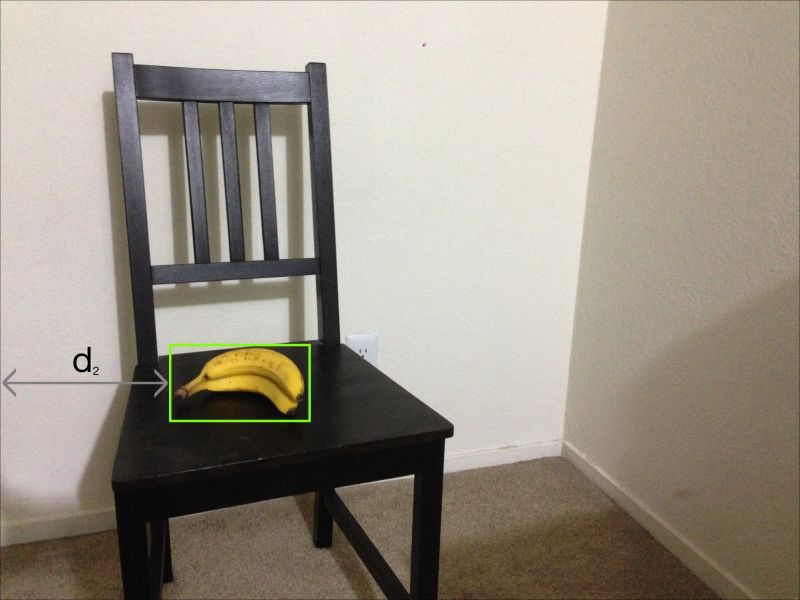

Perbedaan antara d1 dan d2 besar. Sekarang, mari mendekatkan pisang ke kamera:

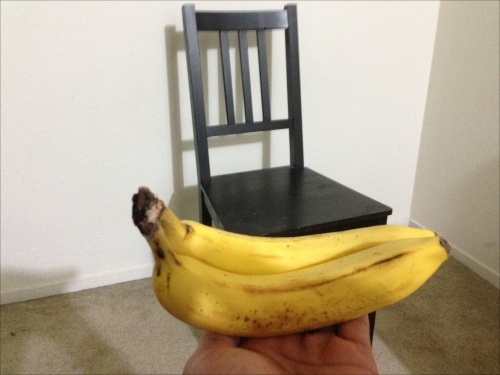

Sekarang, mari gerakkan kamera dengan jumlah yang sama seperti yang kita lakukan sebelumnya, dan tangkap pemandangan yang sama dari sudut ini:

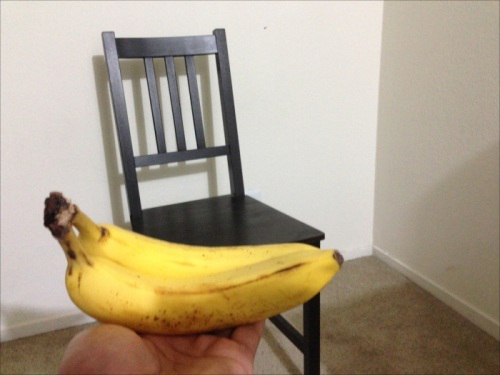

Seperti yang kita lihat, pergerakan antara posisi objek tidak banyak. Jika kita mempertimbangkan koordinat piksel, kita akan melihat bahwa nilainya dekat satu sama lain. Jarak pada gambar pertama adalah:

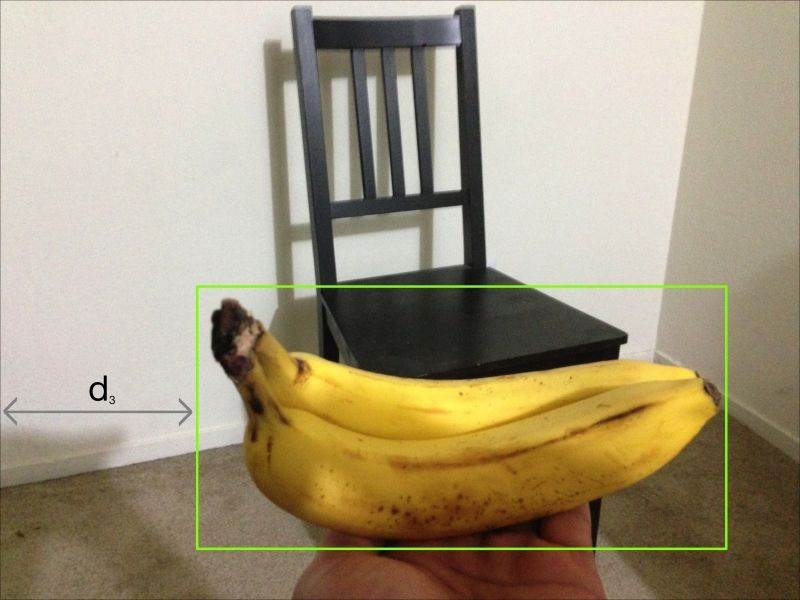

Jika kita perhatikan garis jarak yang sama pada gambar kedua, maka akan seperti yang ditunjukkan pada gambar berikut:

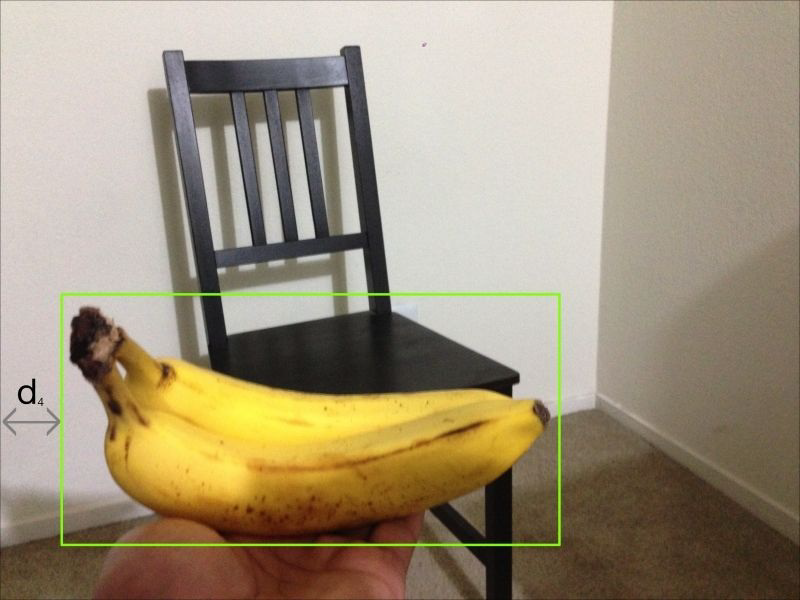

Perbedaan antara d3 dan d4 kecil. Kita dapat mengatakan bahwa perbedaan mutlak antara d1 dan d2 lebih besar daripada perbedaan mutlak antara d3 dan d4. Meskipun kamera digerakkan dengan jumlah yang sama, ada perbedaan besar antara yang terlihat
jarak antara posisi awal dan akhir. Ini terjadi karena kita bisa mendekatkan objek ke kamera; gerakan yang tampak berkurang saat kita mengambil dua gambar dari sudut yang berbeda. Ini adalah konsep di balik korespondensi stereo: kita menangkap dua gambar dan menggunakan pengetahuan ini untuk mengekstrak informasi mendalam dari adegan tertentu.

### Geometri epipolar

Sebelum membahas geometri epipolar, mari kita bahas apa yang terjadi ketika kita menangkap dua gambar pemandangan yang sama dari dua sudut pandang yang berbeda. Perhatikan gambar berikut:

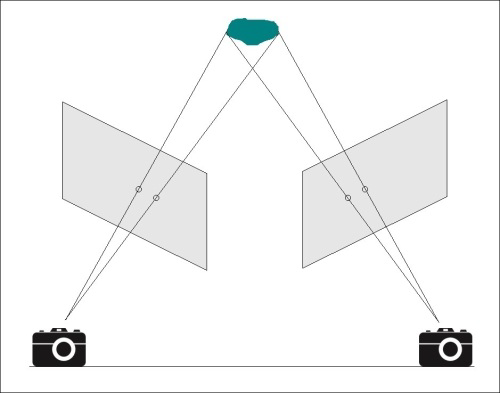

Mari kita lihat bagaimana hal itu terjadi dalam kehidupan nyata. Perhatikan gambar berikut:

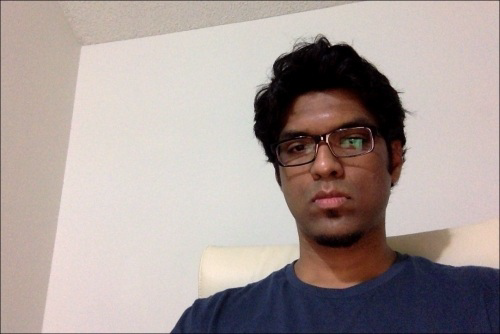

Sekarang, mari kita tangkap pemandangan yang sama dari sudut pandang yang berbeda:

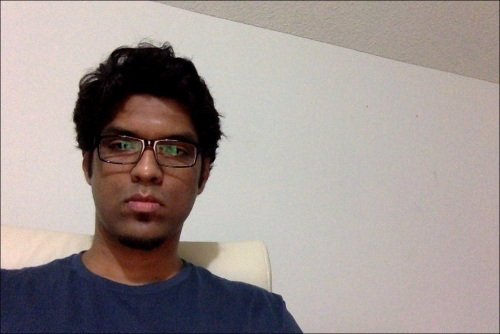

Tujuan kita adalah mencocokkan titik kunci (keypoint) dalam dua gambar tersebut guna mengekstrak informasi dari gambar. Cara kita melakukan ini adalah dengan mengekstraksi matriks yang dapat mengaitkan titik-titik yang sesuai antara dua gambar stereo. Ini disebut matriks fundamental.

Seperti yang kita lihat pada gambar kamera sebelumnya, kita dapat menggambar garis untuk melihat di mana mereka bertemu. Garis-garis ini disebut garis epipolar. Titik di mana garis epipolar bertemu disebut epipol. Jika kita mencocokkan titik kunci menggunakan SIFT, dan menggambar garis menuju titik pertemuan di gambar kiri, akan terlihat seperti ini:

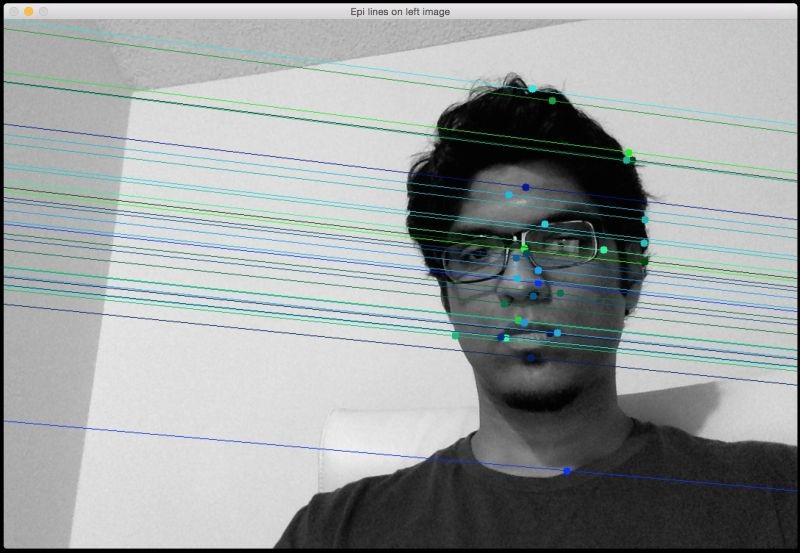

Berikut ini adalah poin fitur yang cocok pada gambar kanan:

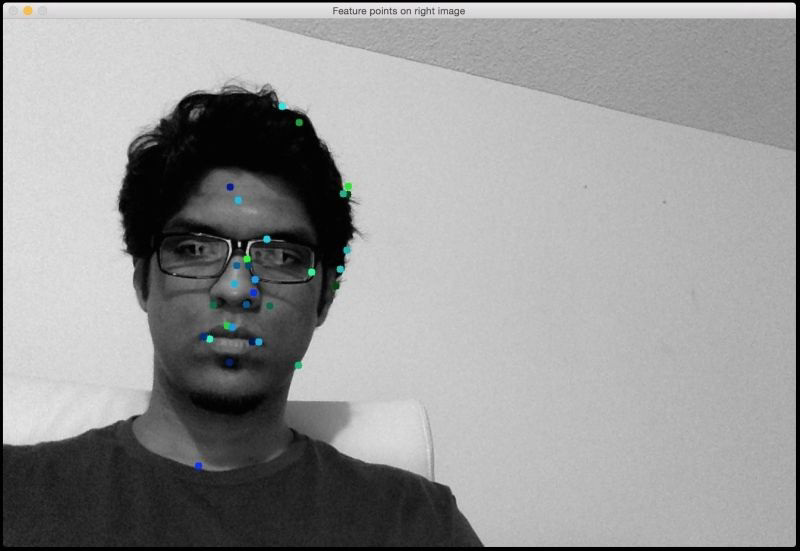

Garis-garis tersebut merupakan garis epipolar. Jika kita mengambil gambar kedua sebagai referensi, maka akan muncul seperti yang ditunjukkan pada gambar berikutnya:

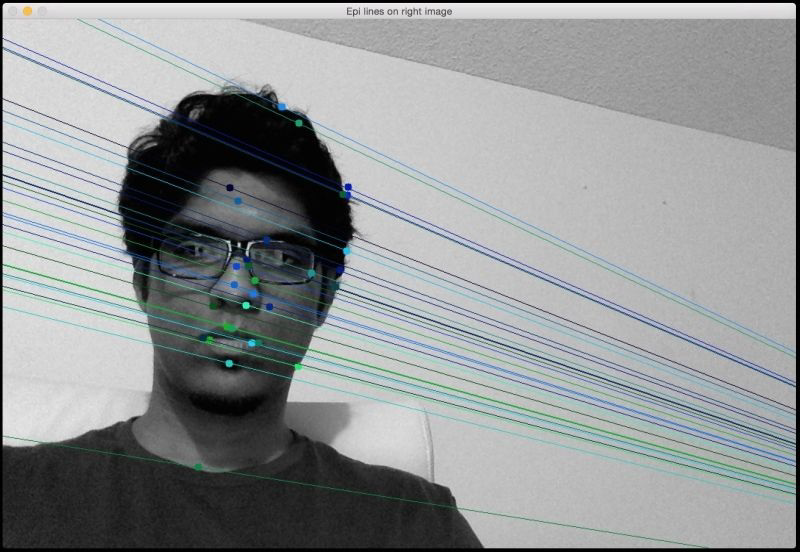

Berikut adalah poin fitur yang cocok pada gambar pertama:

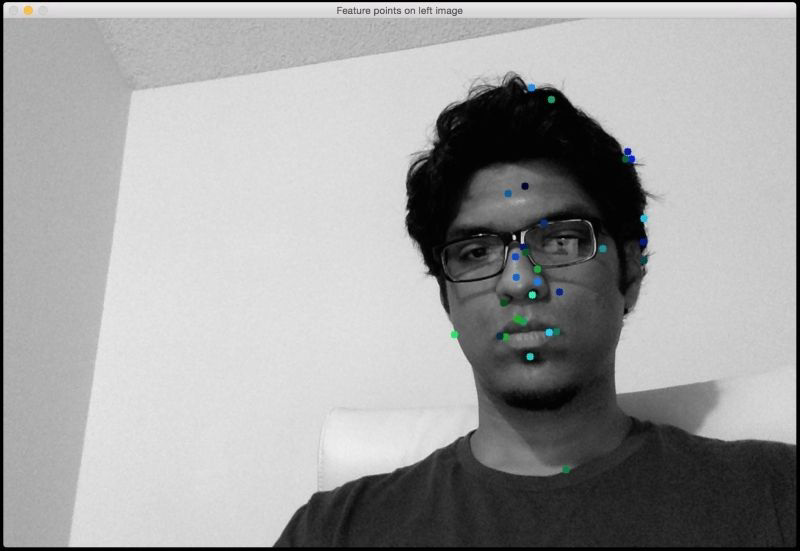

Jika dua frame diposisikan dalam 3D, maka setiap garis epipolar antara dua frame harus memotong fitur yang sesuai di setiap frame dan masing-masing asal kamera. Ini dapat digunakan untuk memperkirakan pose kamera sehubungan dengan lingkungan 3D. Kita akan menggunakan informasi ini nanti, untuk mengekstrak informasi 3D dari tempat kejadian. 

Berikut coding untuk mengekstrak geometri epipolar:

In [1]:
#save code ini dalam file baru dengan nama file: find_fund_matrix.py

import argparse

import cv2
import numpy as np

def build_arg_parser():
    parser = argparse.ArgumentParser(description='Find fundamental matrix \
            using the two input stereo images and draw epipolar lines')
    parser.add_argument("--img-left", dest="img_left", required=True,
            help="Image captured from the left view")
    parser.add_argument("--img-right", dest="img_right", required=True,
            help="Image captured from the right view")
    parser.add_argument("--feature-type", dest="feature_type", 
            required=True, help="Feature extractor that will be used; can be either 'sift' or 'surf'")
    return parser

def draw_lines(img_left, img_right, lines, pts_left, pts_right):
    h,w = img_left.shape
    img_left = cv2.cvtColor(img_left, cv2.COLOR_GRAY2BGR)
    img_right = cv2.cvtColor(img_right, cv2.COLOR_GRAY2BGR)

    for line, pt_left, pt_right in zip(lines, pts_left, pts_right):
        x_start,y_start = map(int, [0, -line[2]/line[1] ])
        x_end,y_end = map(int, [w, -(line[2]+line[0]*w)/line[1] ])
        color = tuple(np.random.randint(0,255,2).tolist())
        cv2.line(img_left, (x_start,y_start), (x_end,y_end), color,1)
        cv2.circle(img_left, tuple(pt_left), 5, color, -1)
        cv2.circle(img_right, tuple(pt_right), 5, color, -1)

    return img_left, img_right

def get_descriptors(gray_image, feature_type):
    if feature_type == 'surf':
        feature_extractor = cv2.SURF_create()
        #Algoritma SURF tidak disertakan lagi dalam paket opencv versi 3 ke atas karena telah dipatenkan dan nonfree.

    elif feature_type == 'sift':
        feature_extractor = cv2.SIFT_create()

    else:
        raise TypeError("Invalid feature type; should be either 'surf' or 'sift'")

    keypoints, descriptors = feature_extractor.detectAndCompute(gray_image, None)
    return keypoints, descriptors

if __name__=='__main__':
    args = build_arg_parser().parse_args()
    img_left = cv2.imread(args.img_left,0)  # left image
    img_right = cv2.imread(args.img_right,0)  # right image
    feature_type = args.feature_type

    if feature_type not in ['sift', 'surf']:
        raise TypeError("Invalid feature type; has to be either 'sift' or 'surf'")

    scaling_factor = 1.0
    img_left = cv2.resize(img_left, None, fx=scaling_factor, 
                fy=scaling_factor, interpolation=cv2.INTER_AREA)
    img_right = cv2.resize(img_right, None, fx=scaling_factor, 
                fy=scaling_factor, interpolation=cv2.INTER_AREA)

    kps_left, des_left = get_descriptors(img_left, feature_type)
    kps_right, des_right = get_descriptors(img_right, feature_type)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)

    # Get the matches based on the descriptors
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(des_left, des_right, k=2)

    pts_left_image = []
    pts_right_image = []

    # ratio test to retain only the good matches
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.7*n.distance:
            pts_left_image.append(kps_left[m.queryIdx].pt)
            pts_right_image.append(kps_right[m.trainIdx].pt)

    pts_left_image = np.float32(pts_left_image)
    pts_right_image = np.float32(pts_right_image)
    F, mask = cv2.findFundamentalMat(pts_left_image, pts_right_image, cv2.FM_LMEDS)

    # Selecting only the inliers 
    pts_left_image = pts_left_image[mask.ravel()==1]
    pts_right_image = pts_right_image[mask.ravel()==1]

    # Drawing the lines on left image and the corresponding feature points on the right image
    lines1 = cv2.computeCorrespondEpilines(pts_right_image.reshape(-1,1,2), 2, F)
    lines1 = lines1.reshape(-1,3)
    img_left_lines, img_right_pts = draw_lines(img_left, img_right, lines1, pts_left_image, pts_right_image)

    # Drawing the lines on right image and the corresponding feature points on the left image
    lines2 = cv2.computeCorrespondEpilines(pts_left_image.reshape(-1,1,2), 1,F)
    lines2 = lines2.reshape(-1,3)
    img_right_lines, img_left_pts = draw_lines(img_right, img_left, lines2, pts_right_image, pts_left_image)

    cv2.imshow('Epi lines on left image', img_left_lines)
    cv2.imshow('Feature points on right image', img_right_pts)
    cv2.imshow('Epi lines on right image', img_right_lines)
    cv2.imshow('Feature points on left image', img_left_pts)
    cv2.waitKey()
    cv2.destroyAllWindows()

usage: ipykernel_launcher.py [-h] --img-left IMG_LEFT --img-right IMG_RIGHT --feature-type FEATURE_TYPE
ipykernel_launcher.py: error: the following arguments are required: --img-left, --img-right, --feature-type


SystemExit: 2

C:\Users\S_340\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3445: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [ ]:
#downgrade opencv, maksimal versi 4.5.1.48

!pip install opencv-contrib-python==4.5.1.48

In [ ]:
#Untuk mengekstrak geometri epipolar menggunakan fitur SIFT:
!python find_fund_matrix.py --img-left left1.png --img-right right1.png --feature-type sift

### Membangun peta 3D

Sekarang kita sudah familiar dengan geometri epipolar, mari kita lihat bagaimana menggunakannya untuk membangun peta 3D berdasarkan gambar stereo. Mari kita perhatikan gambar berikut:

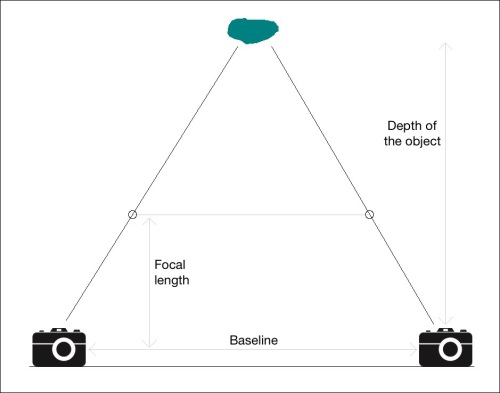

Langkah pertama adalah mengekstrak peta disparitas (disparity map) antara dua gambar. Jika kita melihat gambar, saat kita mendekati objek dari kamera di sepanjang garis penghubung, jarak antar titik berkurang. Dengan menggunakan informasi ini, kita dapat menyimpulkan jarak setiap titik dari kamera. Ini disebut peta kedalaman. Setelah kita menemukan titik yang cocok antara dua gambar, kita dapat menemukan perbedaan dengan menggunakan garis epipolar.
Mari kita perhatikan gambar berikut:

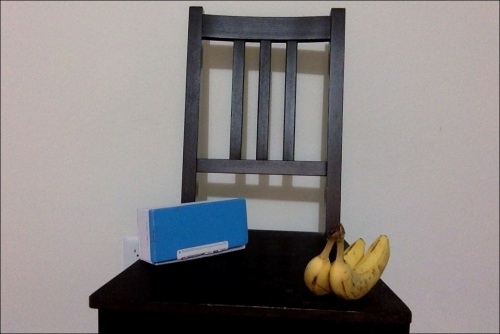

Jika kita menangkap pemandangan yang sama dari posisi yang berbeda, kita mendapatkan gambar berikut:

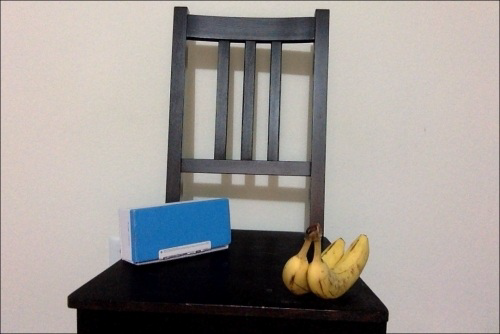

Jika kita merekonstruksi peta 3D, akan terlihat seperti ini:

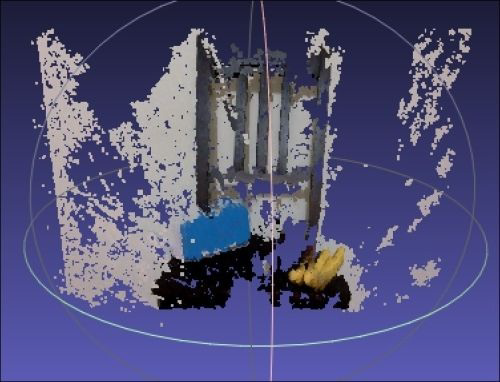

Ingatlah bahwa gambar ini tidak diambil menggunakan kamera stereo yang disejajarkan dengan sempurna. Itulah alasan peta 3D terlihat sangat noisy. Ini hanya untuk menunjukkan bagaimana kita dapat merekonstruksi dunia nyata menggunakan gambar stereo. Mari kita pertimbangkan pasangan gambar yang diambil menggunakan kamera stereo yang disejajarkan dengan benar. Berikut ini adalah gambar tampilan kiri:

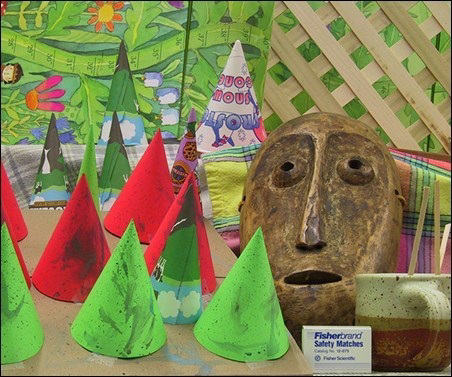

Berikutnya adalah gambar tampilan kanan yang sesuai:

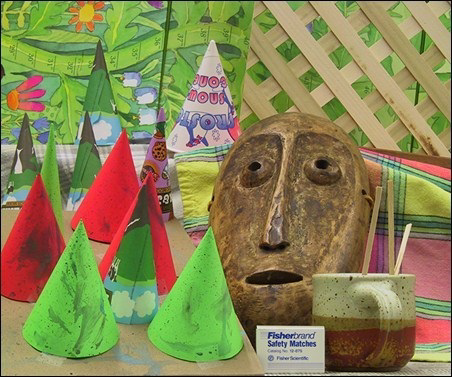

Jika Anda mengekstrak informasi kedalaman dan membuat peta 3D, itu akan terlihat seperti ini:

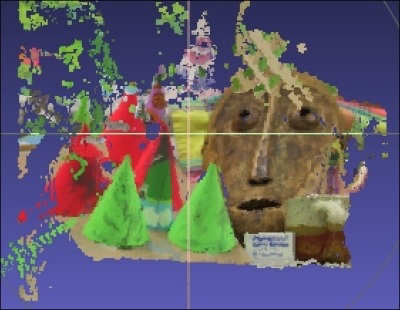

Mari kita putar untuk melihat apakah kedalamannya tepat untuk objek yang lain dalam gambar:

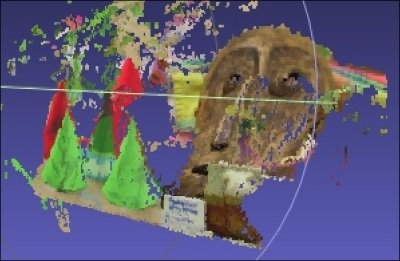

Seperti yang dapat kita lihat pada gambar sebelumnya, item disejajarkan dengan benar sesuai dengan jaraknya dari kamera. Kita dapat secara intuitif melihat bahwa mereka diatur dengan cara yang benar, termasuk posisi topeng yang miring. Kita bisa menggunakan teknik ini untuk membangun banyak hal menarik.

Kita memerlukan software MeshLab untuk memvisualisasikan adegan 3D. MeshLab dapat didownload dari http://meshlab.sourceforge.net.

Buka file output.ply menggunakan MeshLab dan kita akan melihat gambar 3D. Kita dapat memutarnya untuk mendapatkan tampilan 3D lengkap dari adegan yang direkonstruksi.

Berikut ini codingnya:

In [ ]:
#save code ini dalam file baru dengan nama file: stereo_match.py

import argparse

import cv2
import numpy as np

def build_arg_parser():
    parser = argparse.ArgumentParser(description='Reconstruct the 3D map from \
            the two input stereo images. Output will be saved in \'output.ply\'')
    parser.add_argument("--image-left", dest="image_left", required=True,
            help="Input image captured from the left")
    parser.add_argument("--image-right", dest="image_right", required=True,
            help="Input image captured from the right")
    parser.add_argument("--output-file", dest="output_file", required=True,
            help="Output filename (without the extension) where the point cloud will be saved")
    return parser

def create_output(vertices, colors, filename):
    colors = colors.reshape(-1, 3)
    vertices = np.hstack([vertices.reshape(-1,3), colors])

    ply_header = '''ply
        format ascii 1.0
        element vertex %(vert_num)d
        property float x
        property float y
        property float z
        property uchar red
        property uchar green
        property uchar blue
        end_header
    '''

    with open(filename, 'w') as f:
        f.write(ply_header % dict(vert_num=len(vertices)))
        np.savetxt(f, vertices, '%f %f %f %d %d %d')

if __name__ == '__main__':
    args = build_arg_parser().parse_args()
    image_left = cv2.imread(args.image_left)
    image_right = cv2.imread(args.image_right)
    output_file = args.output_file + '.ply'

    if image_left.shape[0] != image_right.shape[0] or \
            image_left.shape[1] != image_right.shape[1]:
        raise TypeError("Input images must be of the same size")

    # downscale images for faster processing
    image_left = cv2.pyrDown(image_left)  
    image_right = cv2.pyrDown(image_right)

    #Set disparity parameters
    #Note: disparity range is tuned according to specific parameters obtained through trial and error. 
    win_size = 5
    min_disp = -1
    max_disp = 63 #min_disp * 9
    num_disp = max_disp - min_disp # Needs to be divisible by 16
    #Create Block matching object. 
    stereo = cv2.StereoSGBM_create(minDisparity= min_disp,
        numDisparities = num_disp,
        blockSize = 5,
        uniquenessRatio = 5,
        speckleWindowSize = 5,
        speckleRange = 5,
        disp12MaxDiff = 1,
        P1 = 8*3*win_size**2,
        P2 =32*3*win_size**2 
    )
    
    print ("\nComputing the disparity map ...")
    disparity_map = stereo.compute(image_left, image_right).astype(np.float32) / 16.0
    print(disparity_map)

    print ("\nGenerating the 3D map ...")
    h, w = image_left.shape[:2]
    focal_length = 0.8*w                          

    # Perspective transformation matrix
    Q = np.float32([[1, 0, 0, -w/2.0],
                    [0,-1, 0,  h/2.0], 
                    [0, 0, 0, -focal_length], 
                    [0, 0, 1, 0]])

    points_3D = cv2.reprojectImageTo3D(disparity_map, Q)
    colors = cv2.cvtColor(image_left, cv2.COLOR_BGR2RGB)
    mask_map = disparity_map > disparity_map.min()
    output_points = points_3D[mask_map]
    output_colors = colors[mask_map]

    print ("\nCreating the output file ...\n")
    create_output(output_points, output_colors, output_file)

In [ ]:
#Untuk membangun peta 3D
!python stereo_match.py --image-left left1.png --image-right right1.png --output-file output

In [ ]:
#Latihan
#Capture sebuah objek bebas dari posisi kanan dan kiri, ketinggian kamera harus sama!
#Lakukan tahapan-tahapan praktikum di atas!
#laporkan apa yang Anda temukan dalam eksperimen Anda!
#Kumpulkan file html-nya saja melalui e-learning!
